# Sharded WGA Segmentation

In [1]:
import os
import numpy as np
import pandas as pd

from scportrait.pipeline.featurization import CellFeaturizer
from scportrait.pipeline.extraction import HDF5CellExtraction
from scportrait.pipeline.project import Project
from scportrait.pipeline.segmentation.workflows import ShardedWGASegmentation
from scportrait.pipeline.selection import LMDSelection
import scportrait

In [2]:
project_location = "project_WGA"
config_path = scportrait.data.get_config_file(config_id = "dataset_1_wga_config")

project = Project(
    os.path.abspath(project_location),
    config_path="config_example1_WGASegmentation.yml",
    overwrite=True,
    debug=True,
    segmentation_f=ShardedWGASegmentation,
    extraction_f=HDF5CellExtraction,
    featurization_f=CellFeaturizer,
    selection_f=LMDSelection,
)

Updating project config file.
[10/04/2025 18:56:33] Loading config from /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/config.yml
[10/04/2025 18:56:33] No cache directory specified in config using current working directory /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1.
[10/04/2025 18:56:33] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/ShardedWGASegmentation_xuldzwzq for ShardedWGASegmentation
[10/04/2025 18:56:33] Compression algorithm for extracted single-cell images: lzf
[10/04/2025 18:56:33] No cache directory specified in config using current working directory /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1.


In [3]:
dataset_1_path = scportrait.data.dataset_1()

# these example images are downloaded from the human protein atlas (www.proteinatlas.org)
images = [f"{dataset_1_path}/Ch1.tif", f"{dataset_1_path}/Ch2.tif", f"{dataset_1_path }/Ch3.tif"]

project.load_input_from_tif_files(images, channel_names=["Hoechst", "Alexa488", "mCherry"])

[10/04/2025 18:56:39] Output location /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/scportrait.sdata already exists. Overwriting.
INFO     The Zarr backing store has been changed from None the new file path:                                      
         /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/scport
         rait.sdata                                                                                                


[10/04/2025 18:56:39] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/Project_9a4rgx08 for Project
[10/04/2025 18:56:40] Image input_image written to sdata object.
[10/04/2025 18:56:40] Cleaned up temporary directory at <TemporaryDirectory '/Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/Project_9a4rgx08'>


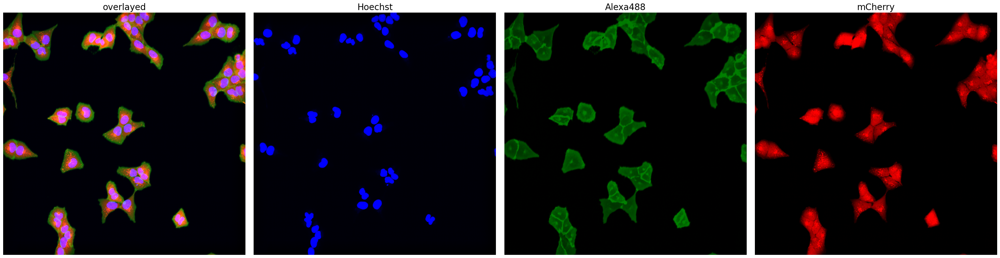

In [4]:
project.plot_input_image()

[10/04/2025 18:56:42] Mapped input image to memory-mapped array.
[10/04/2025 18:56:42] Created new shard directory /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/segmentation/tiles
[10/04/2025 18:56:42] target size 4000000 is smaller than input image 9229443. Sharding will be used.
[10/04/2025 18:56:42] input image 3039 px by 3037 px
[10/04/2025 18:56:42] target_shard_size: 4000000
[10/04/2025 18:56:42] sharding plan:
[10/04/2025 18:56:42] 2 rows by 2 columns
[10/04/2025 18:56:42] 1519 px by 1518 px
[10/04/2025 18:56:42] Saving Sharding plan to file: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/segmentation/sharding_plan.csv
[10/04/2025 18:56:42] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/WGASegmentation_3qifkf_w for WGASegmentation
[10/04/2025 18:56:42] Initialized temporary directory at /Users/sophi

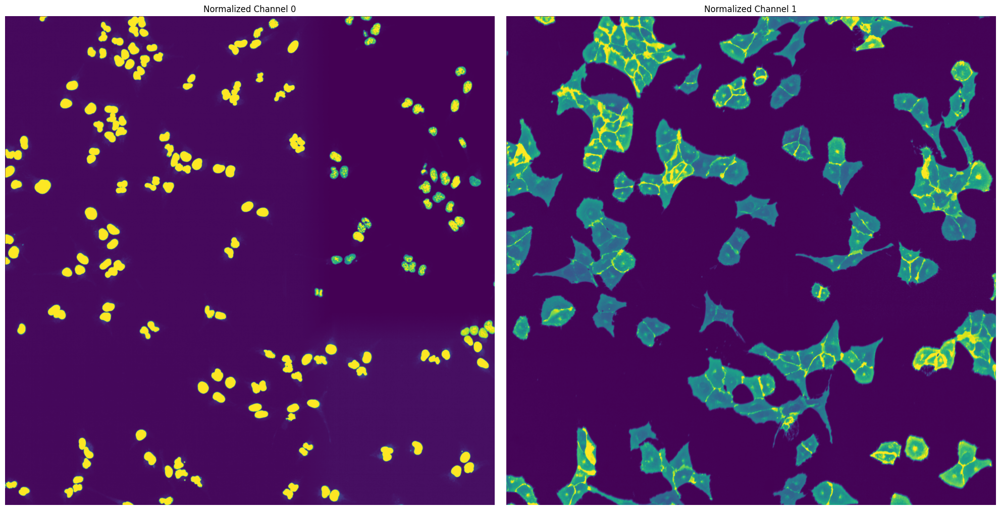

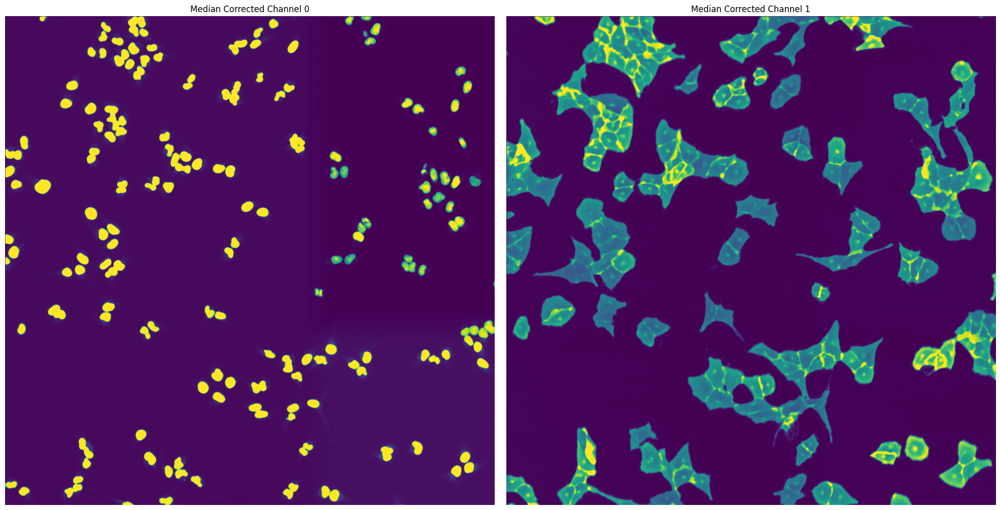

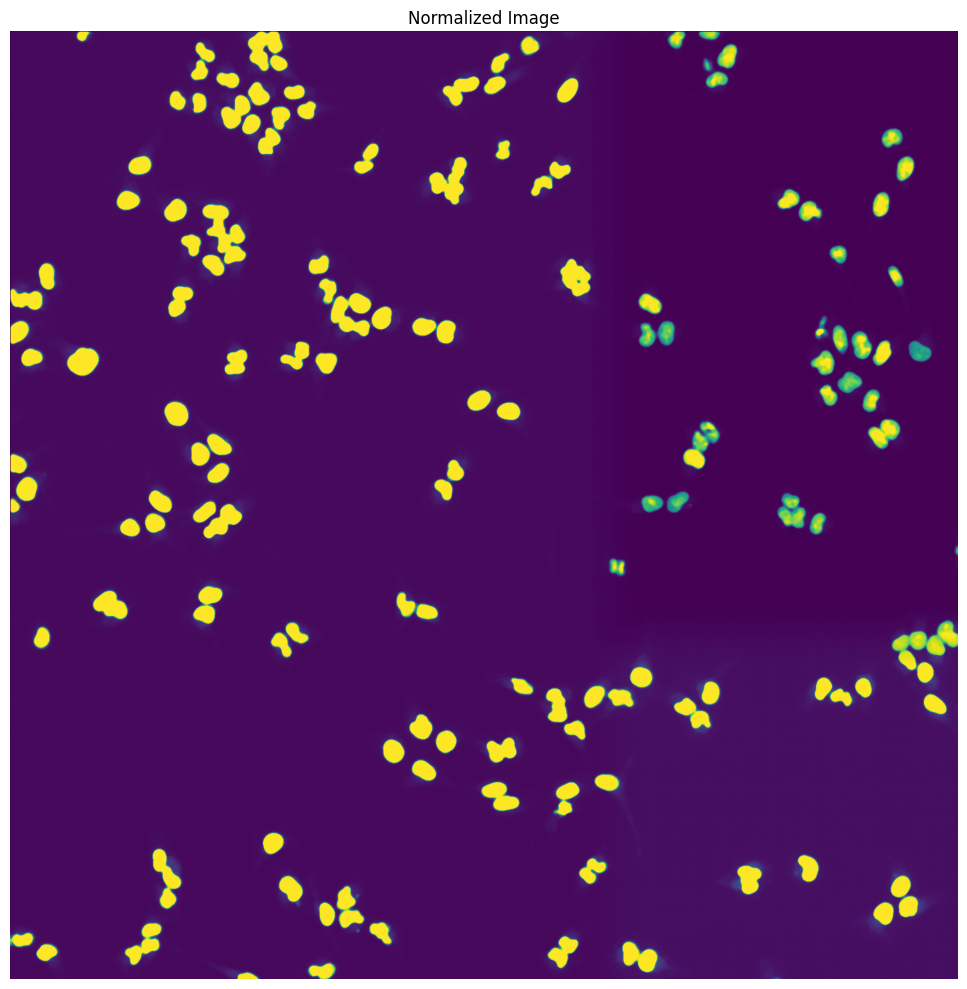

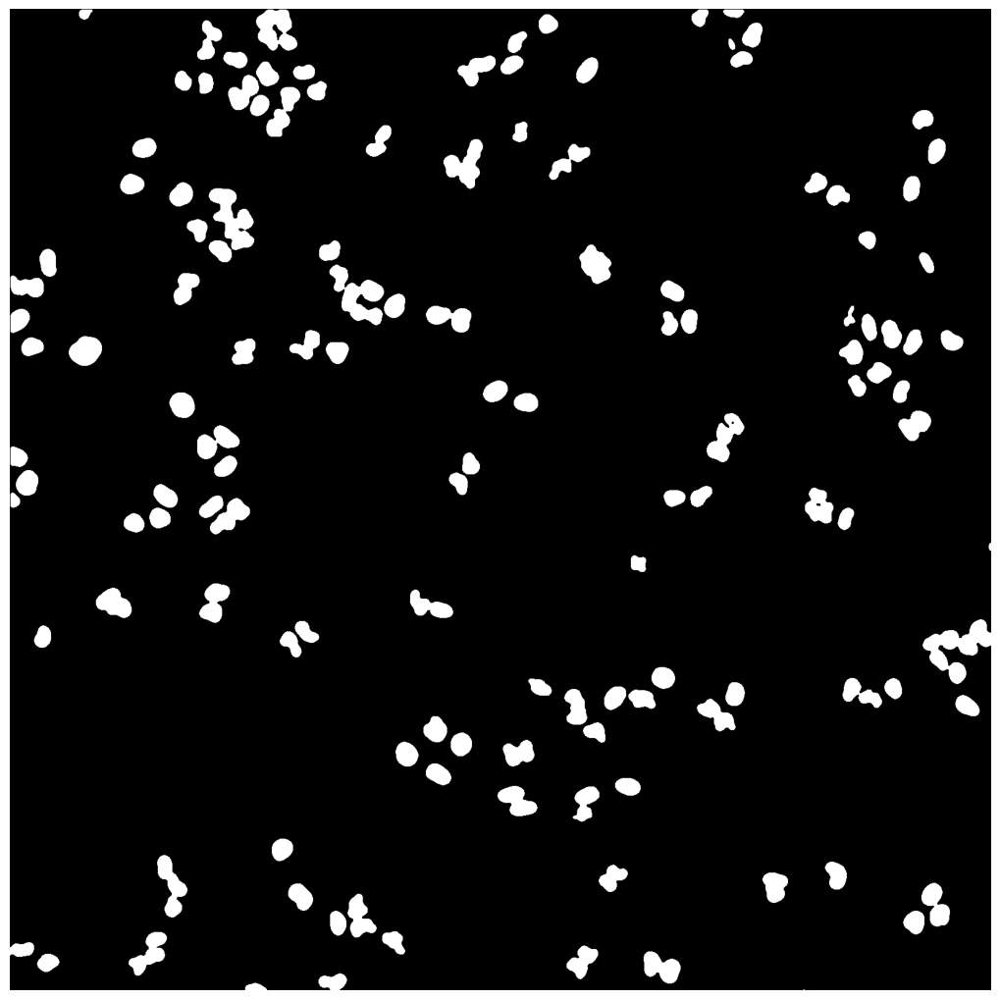

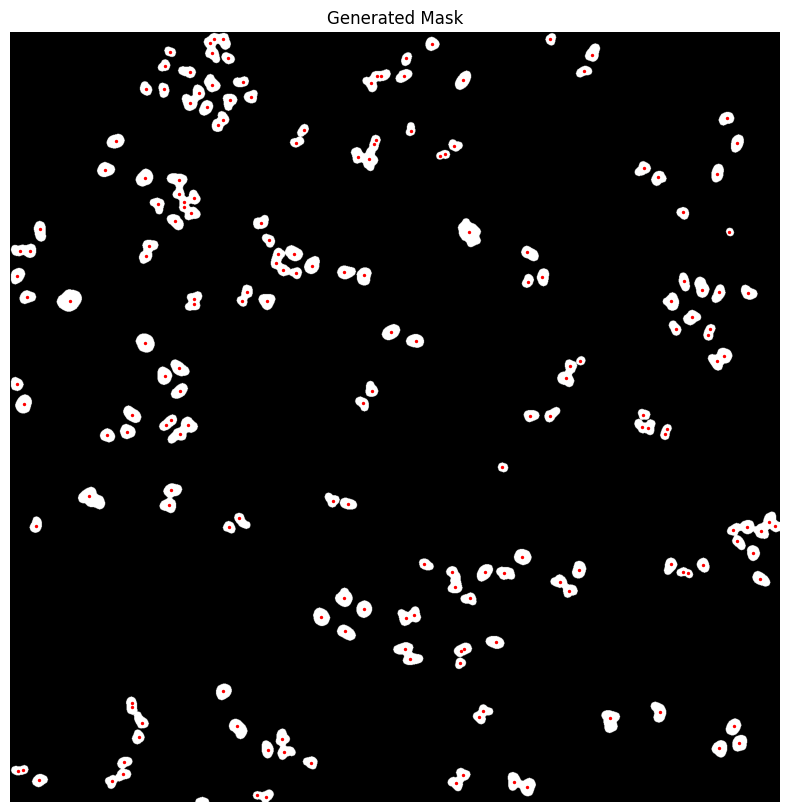

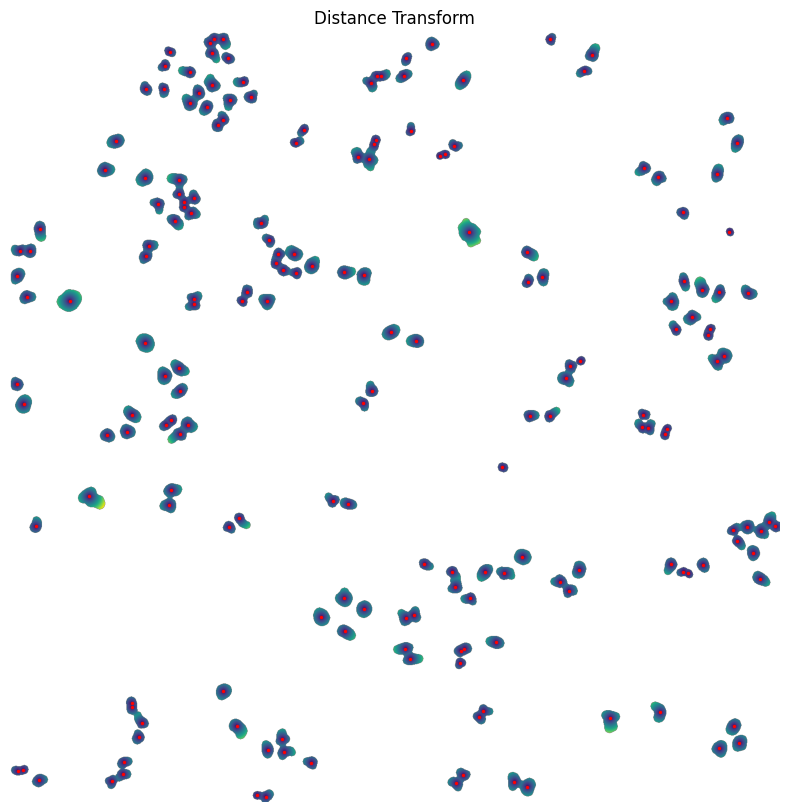

[10/04/2025 18:56:53] Performing filtering of nucleus with specified thresholds [200, 5000] from config file.
[10/04/2025 18:56:53] Removed 1 nuclei as they fell outside of the threshold range [200, 5000].
[10/04/2025 18:56:53] Total time to perform nucleus size filtering: 0.5859169960021973 seconds


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


[10/04/2025 18:56:55] Filtered out 5 nuclei due to contact filtering.
[10/04/2025 18:56:55] Normalizing each channel to the same range
[10/04/2025 18:56:56] Cytosol Potential Mask generated.
[10/04/2025 18:56:57] Performing filtering of cytosol with specified thresholds [200, 30000] from config file.


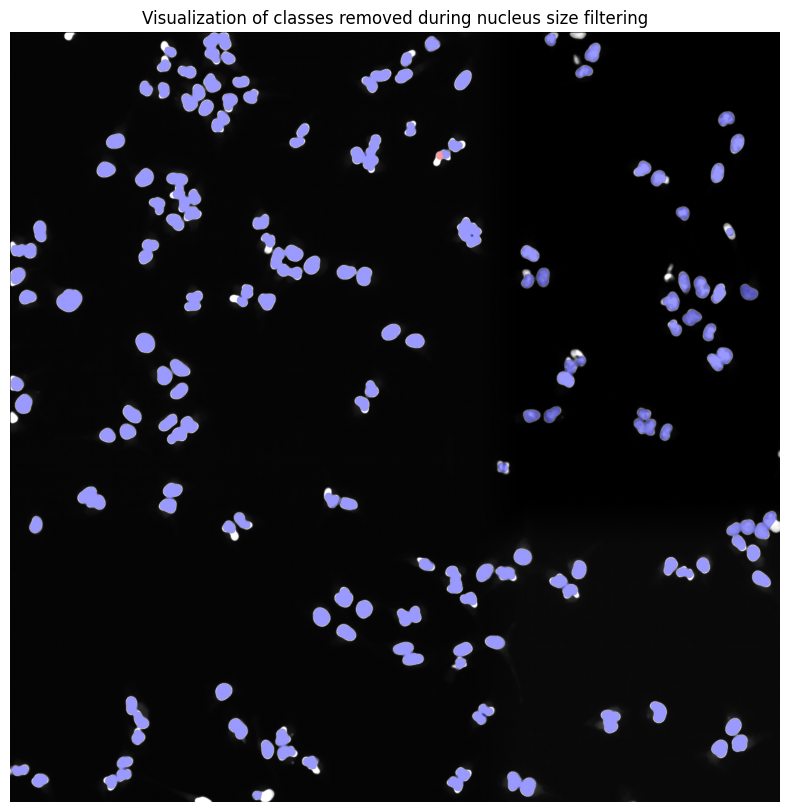

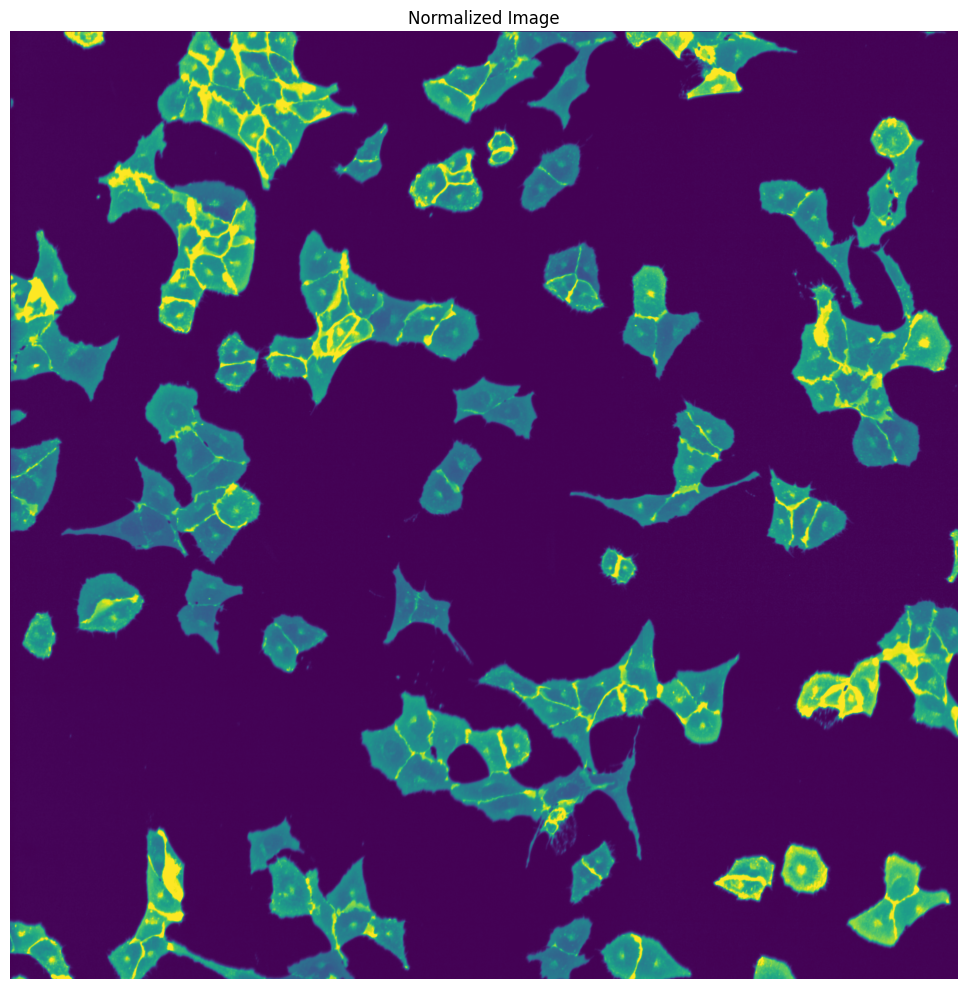

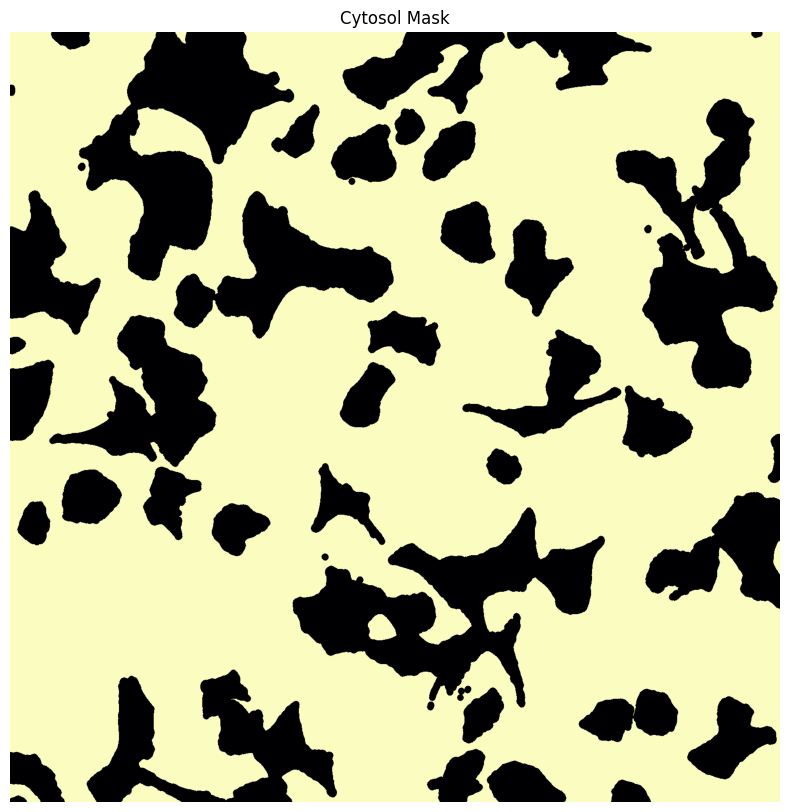

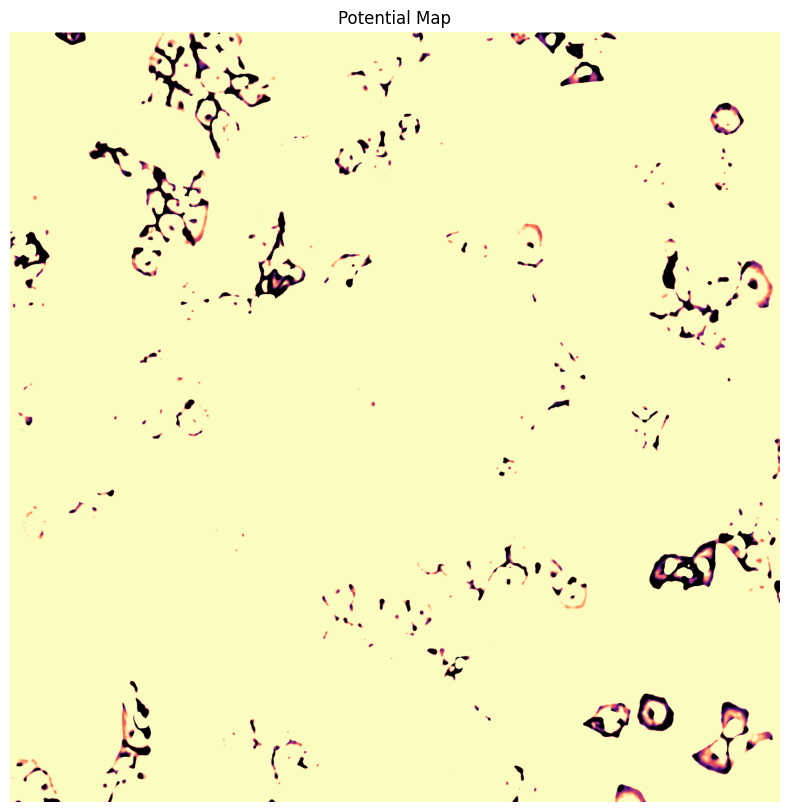

[10/04/2025 18:56:58] Removed 0 nuclei as they fell outside of the threshold range [200, 30000].
[10/04/2025 18:56:58] Total time to perform cytosol size filtering: 1.7187457084655762 seconds
[10/04/2025 18:56:59] Filtering status for this segmentation is set to True.
[10/04/2025 18:56:59] Filtering has been performed during segmentation. Nucleus and Cytosol IDs match. No additional steps are required.
[10/04/2025 18:56:59] Saved cell_id classes to file /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/segmentation/tiles/0/classes.csv.
[10/04/2025 18:56:59] === Finished segmentation of shard ===
[10/04/2025 18:56:59] Cleaned up temporary directory at <TemporaryDirectory '/Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/WGASegmentation_3qifkf_w'>
[10/04/2025 18:56:59] Segmentation of Shard with the slicing (slice(0, 1619, None), slice(0, 1618, None)) finished
[10/04/2025 18:56:59] Beginning Segmenta

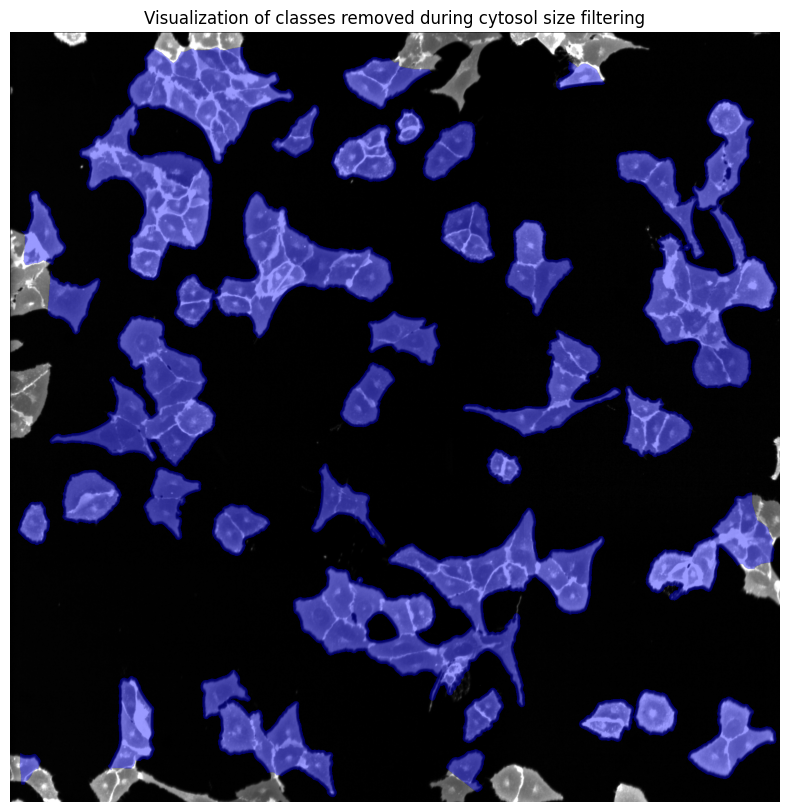

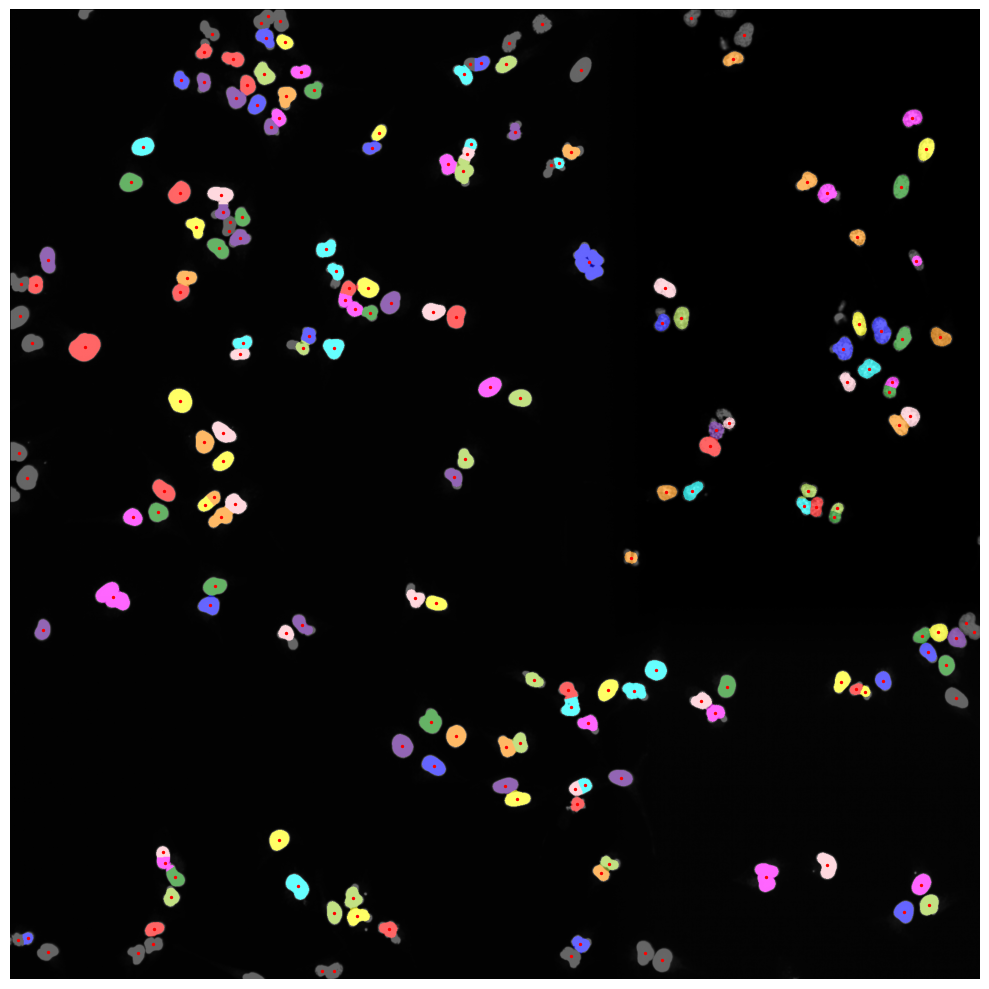

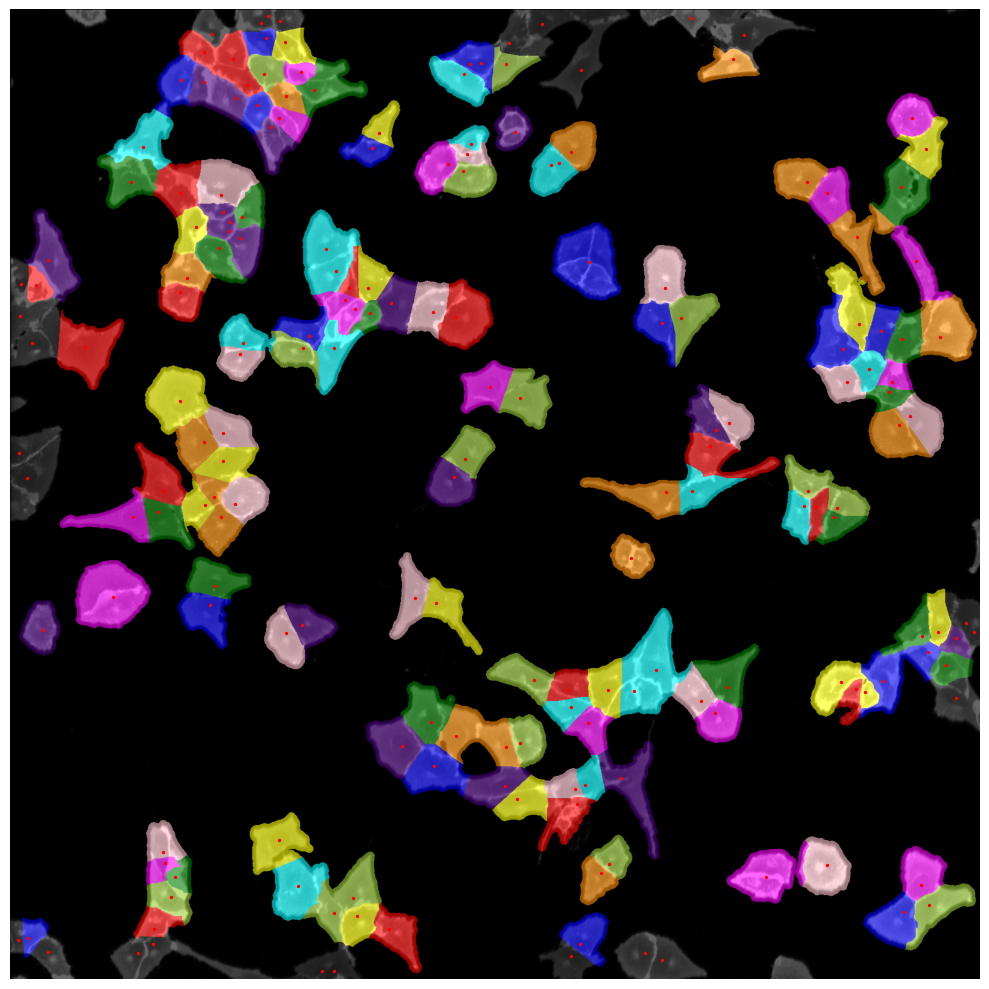

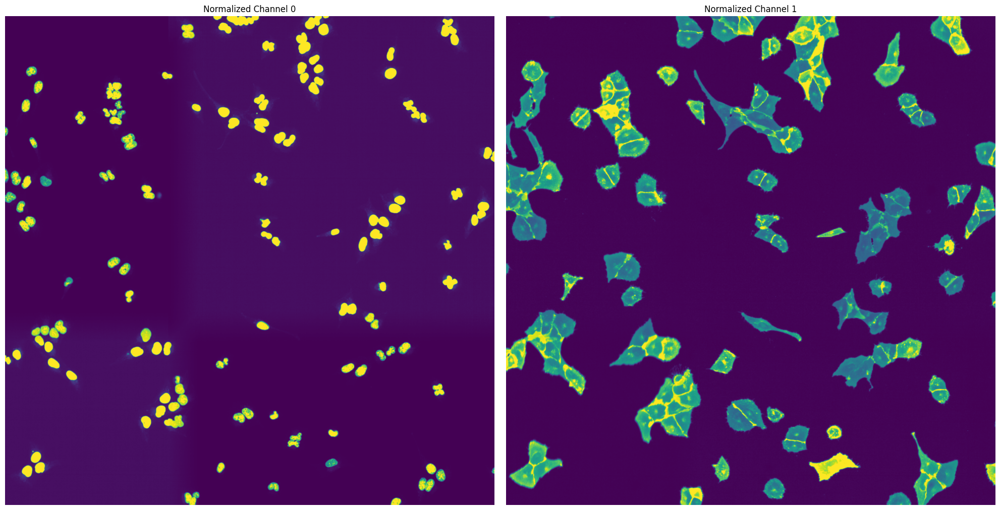

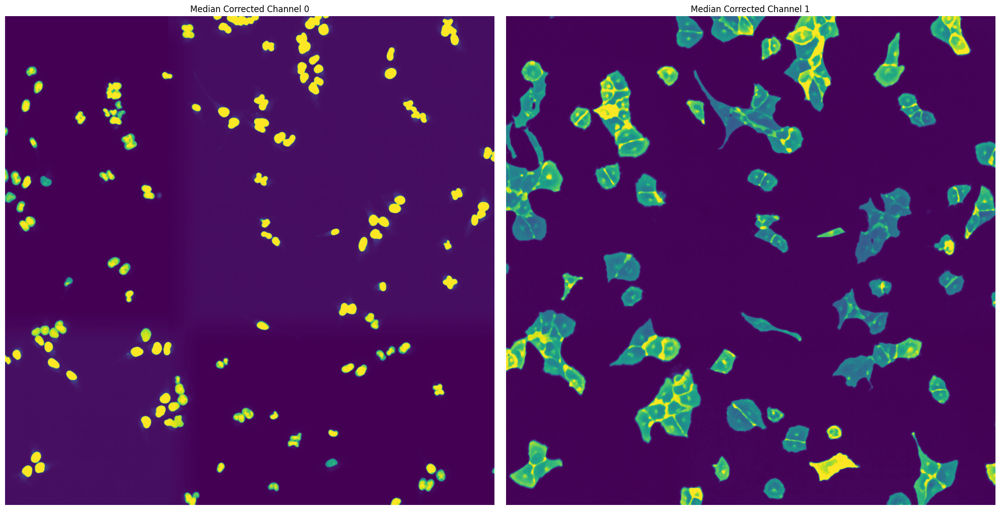

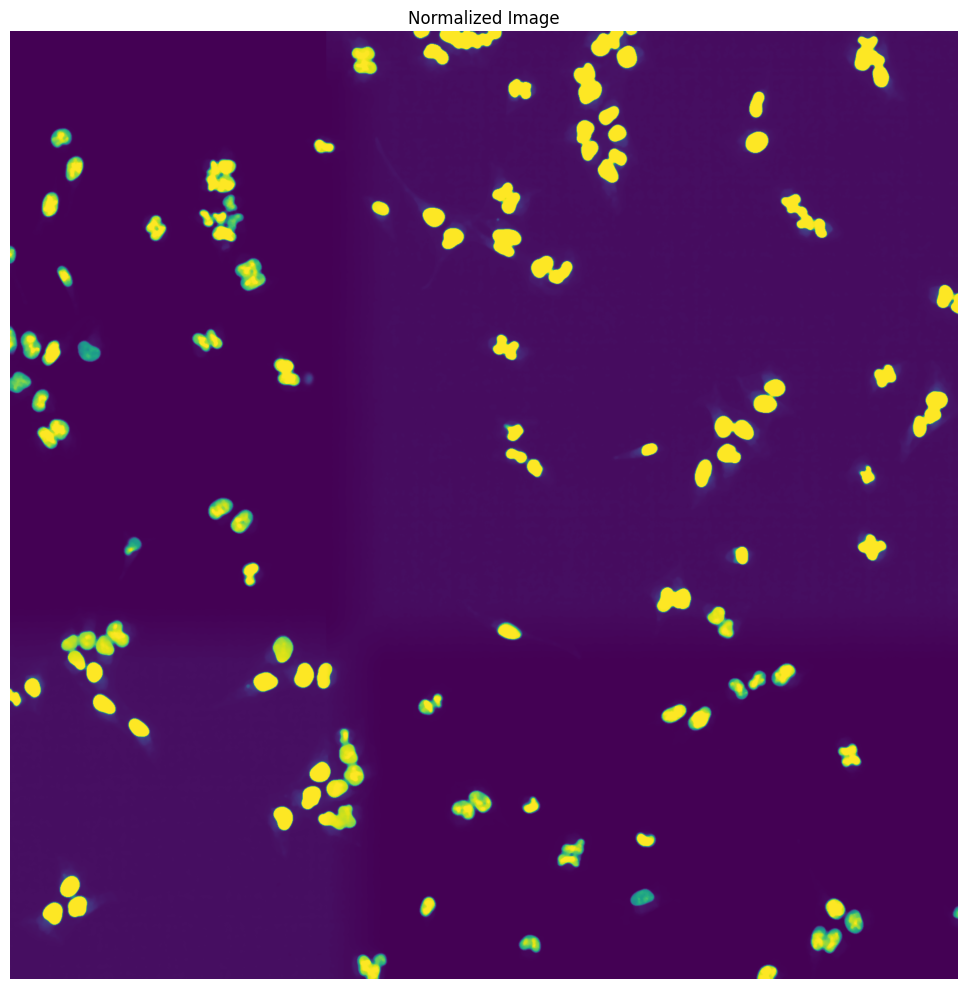

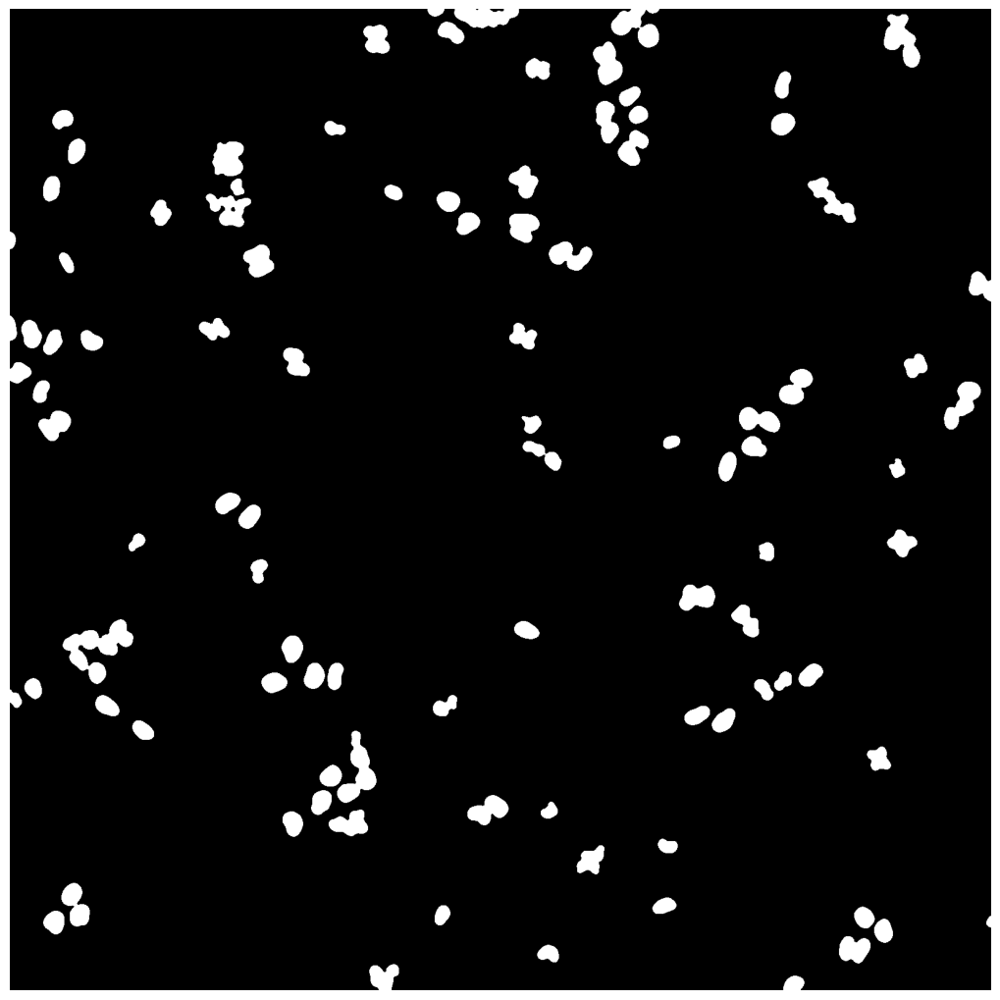

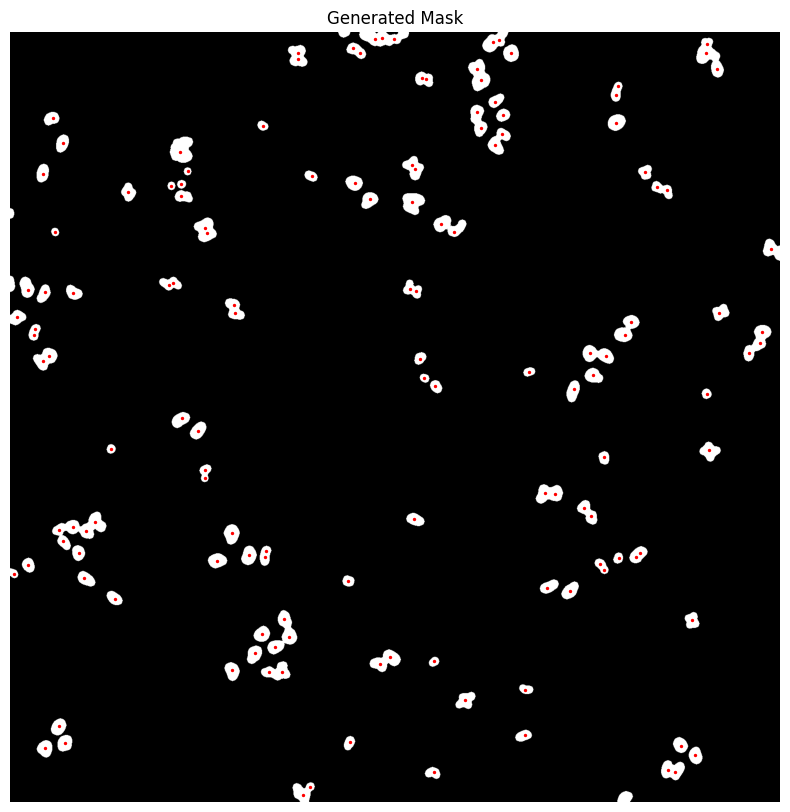

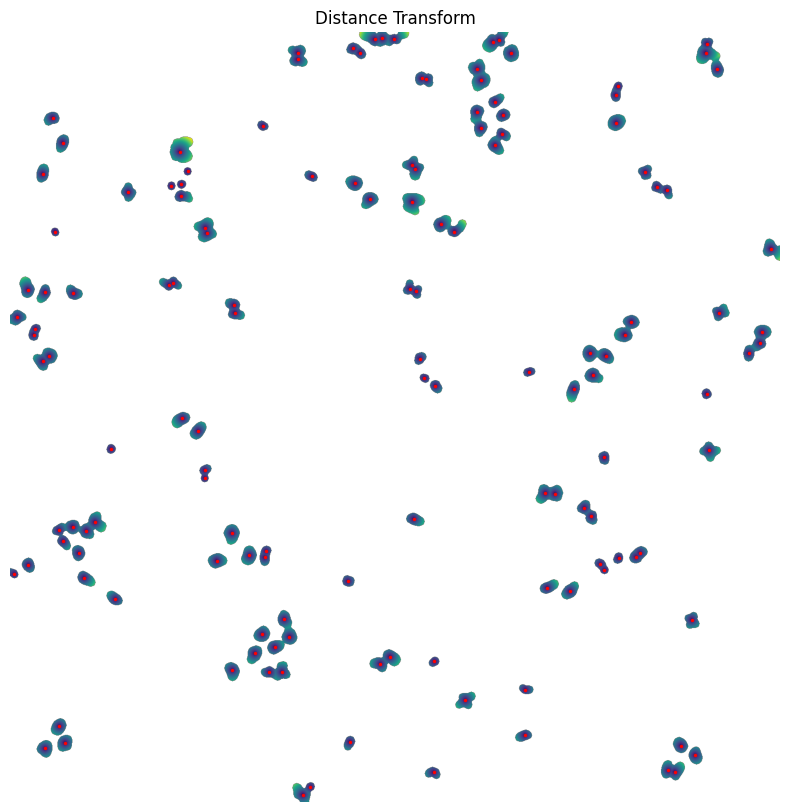

[10/04/2025 18:57:09] Performing filtering of nucleus with specified thresholds [200, 5000] from config file.
[10/04/2025 18:57:09] Removed 0 nuclei as they fell outside of the threshold range [200, 5000].
[10/04/2025 18:57:09] Total time to perform nucleus size filtering: 0.6056778430938721 seconds
[10/04/2025 18:57:09] Filtered out 0 nuclei due to contact filtering.
[10/04/2025 18:57:09] Normalizing each channel to the same range
[10/04/2025 18:57:10] Cytosol Potential Mask generated.
[10/04/2025 18:57:11] Performing filtering of cytosol with specified thresholds [200, 30000] from config file.


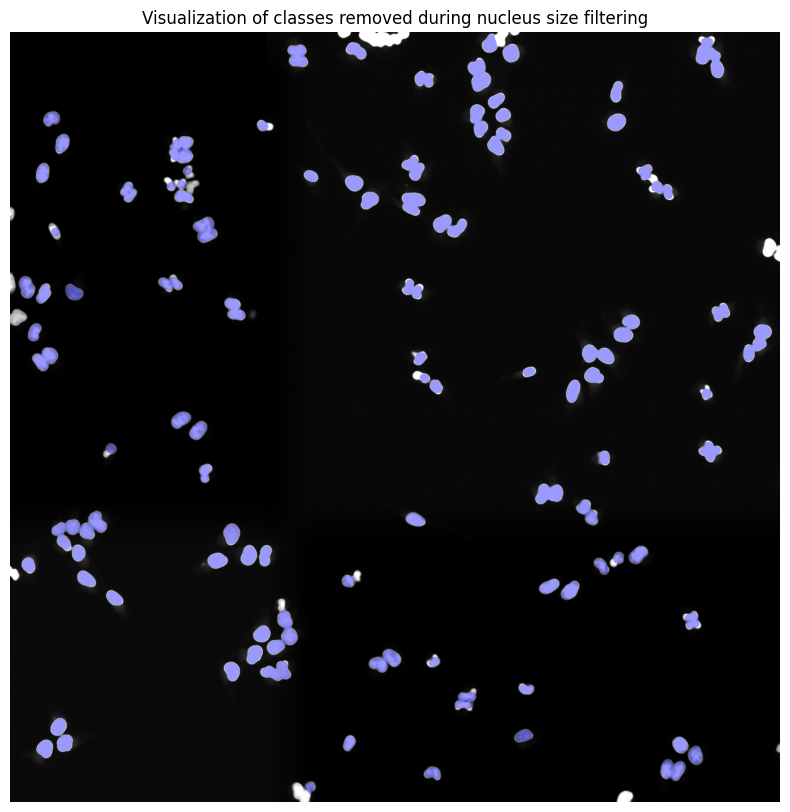

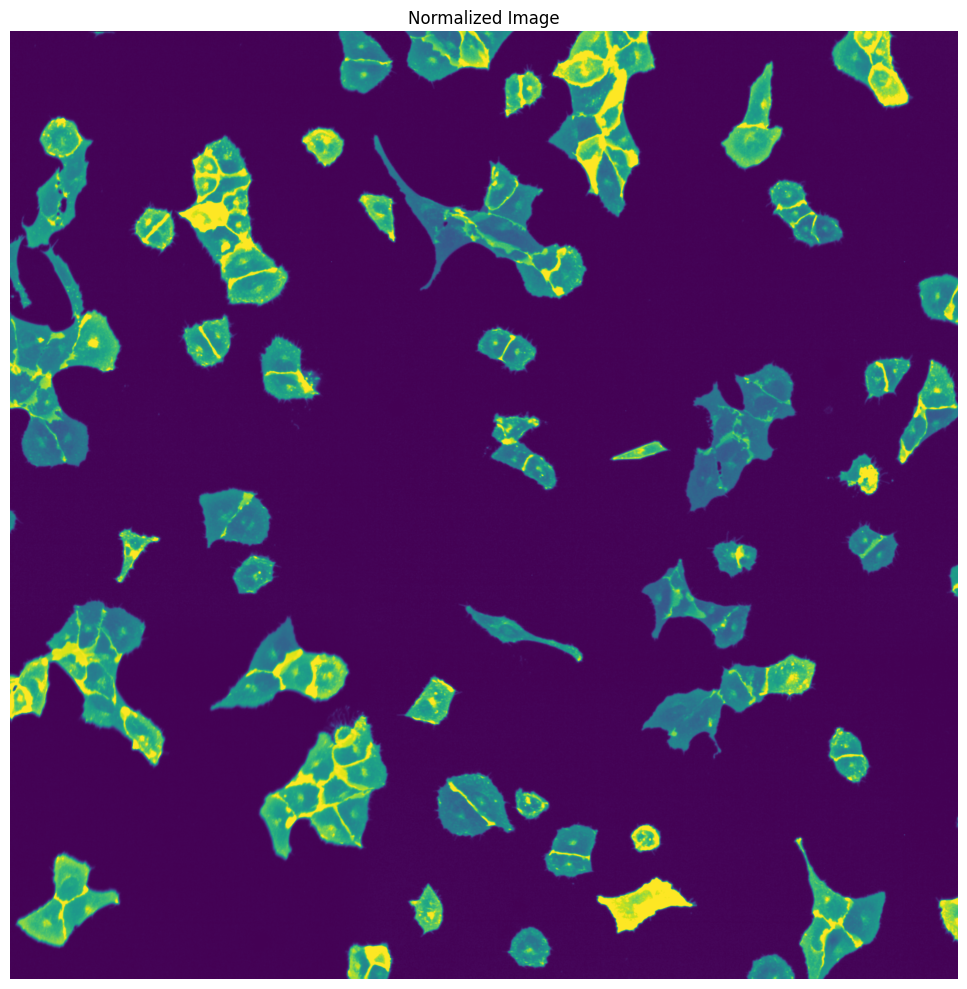

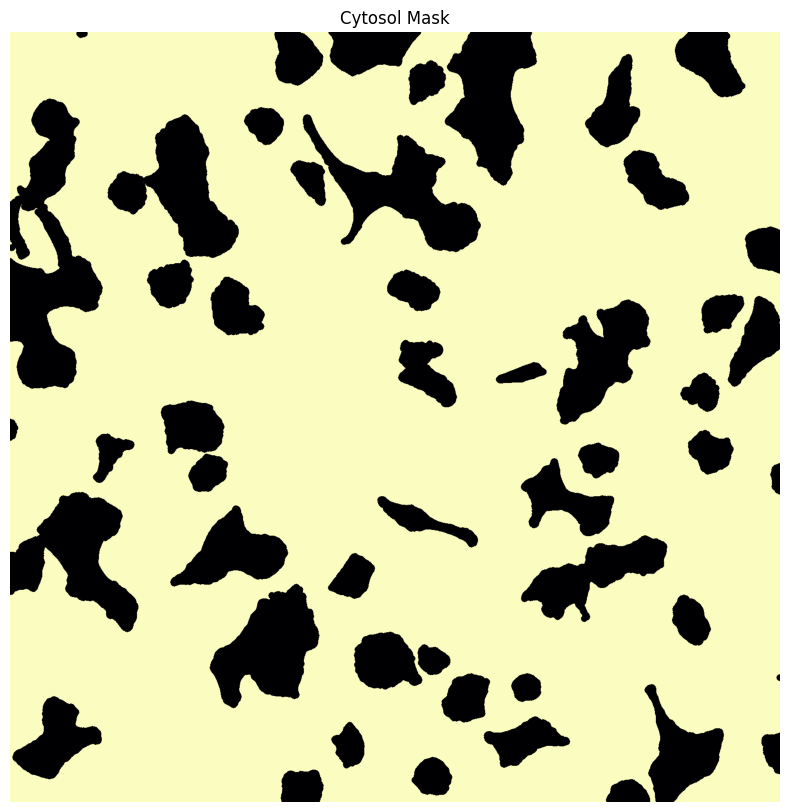

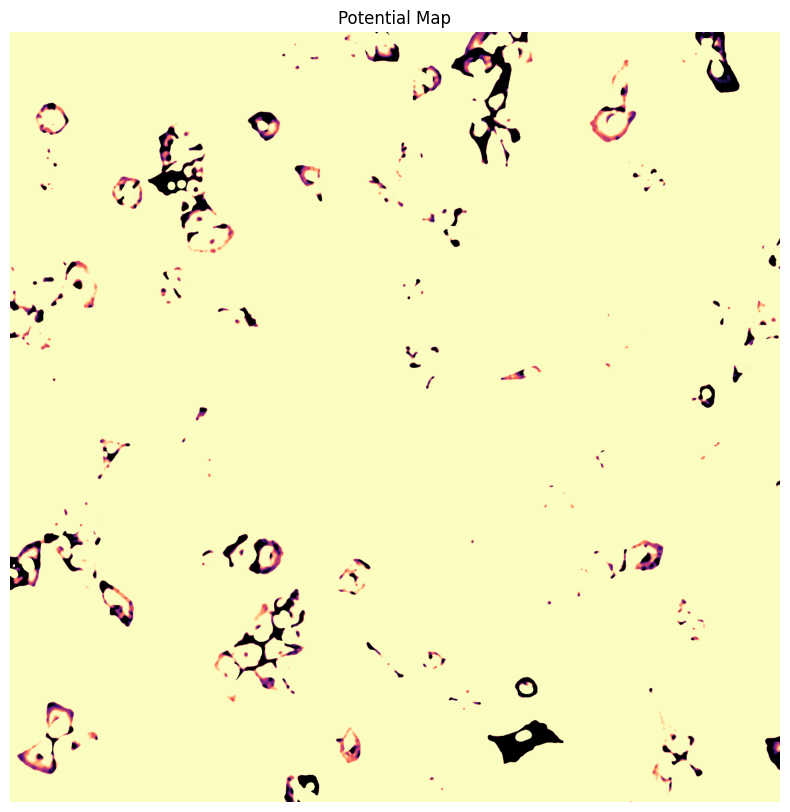

[10/04/2025 18:57:12] Removed 0 nuclei as they fell outside of the threshold range [200, 30000].
[10/04/2025 18:57:13] Total time to perform cytosol size filtering: 1.800154209136963 seconds
[10/04/2025 18:57:13] Filtering status for this segmentation is set to True.
[10/04/2025 18:57:13] Filtering has been performed during segmentation. Nucleus and Cytosol IDs match. No additional steps are required.
[10/04/2025 18:57:13] Saved cell_id classes to file /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/segmentation/tiles/1/classes.csv.
[10/04/2025 18:57:13] === Finished segmentation of shard ===
[10/04/2025 18:57:13] Cleaned up temporary directory at <TemporaryDirectory '/Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/WGASegmentation_s_4ulags'>
[10/04/2025 18:57:14] Segmentation of Shard with the slicing (slice(0, 1619, None), slice(1418, 3037, None)) finished
[10/04/2025 18:57:14] Beginning Segmen

In [ ]:
project.segment()

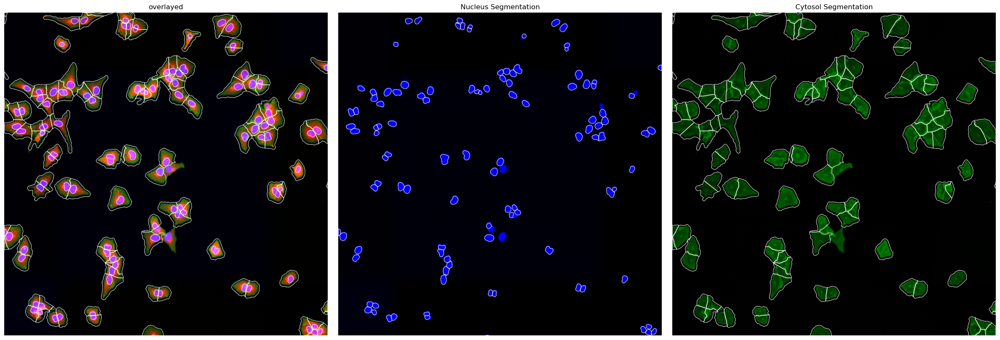

In [ ]:
project.plot_segmentation_masks()

In [ ]:
project.extract()

[20/03/2025 14:06:46] Initialized temporary directory at /var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./HDF5CellExtraction_l4so2nle for HDF5CellExtraction
[20/03/2025 14:06:46] Created new directory for extraction results: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_sharded_WGA/extraction/data
[20/03/2025 14:06:46] Setup output folder at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_sharded_WGA/extraction/data
[20/03/2025 14:06:46] Found 2 segmentation masks for the given key in the sdata object. Will be extracting single-cell images based on these masks: ['seg_all_nucleus', 'seg_all_cytosol']
[20/03/2025 14:06:46] Using seg_all_nucleus as the main segmentation mask to determine cell centers.
[20/03/2025 14:06:46] A total of 16 cells were too close to the image border to be extracted. Their cell_ids were saved to file /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/exa

Extracting cell batches:   0%|          | 0/5 [00:00<?, ?it/s]

[20/03/2025 14:06:47] Finished extraction in 0.55 seconds (747.58 cells / second)
[20/03/2025 14:06:47] Benchmarking times saved to file.
[20/03/2025 14:06:47] Cleaned up temporary directory at <TemporaryDirectory '/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./HDF5CellExtraction_l4so2nle'>


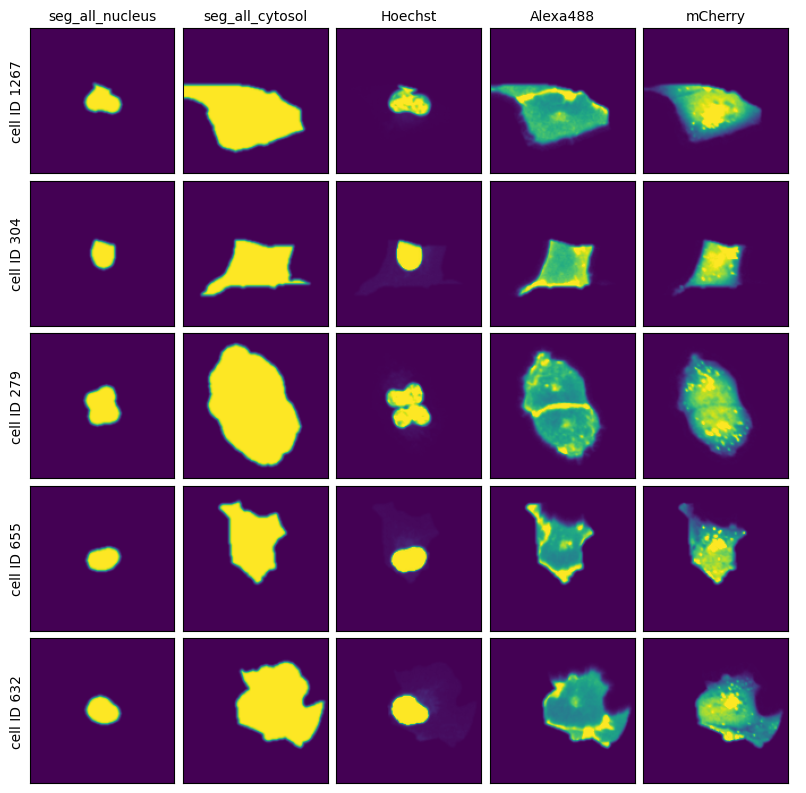

In [ ]:
project.plot_single_cell_images()

In [ ]:
project.featurize(overwrite=True)

Using extraction directory: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_sharded_WGA/extraction/data/single_cells.h5sc
[20/03/2025 14:06:48] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/CellFeaturizer_kdmn2q98 for CellFeaturizer
[20/03/2025 14:06:48] Started CellFeaturization of all available channels.
[20/03/2025 14:06:48] Created new directory for featurization results: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_sharded_WGA/featurization/complete_CellFeaturizer
[20/03/2025 14:06:48] CPU specified in config file but MPS available on system. Consider changing the device for the next run.
[20/03/2025 14:06:48] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/CellFeaturizer_rfl_d9pu for CellFeaturizer
[20/03/2025 14:06:48] Reading data 

In [ ]:
# load classification results
results = project.sdata['CellFeaturizer_cytosol'].to_df().merge(project.sdata['CellFeaturizer_cytosol'].obs, left_index=True, right_index=True).drop(columns = "region")
results

,nucleus_area,cytosol_area,cytosol_only_area,Hoechst_mean_nucleus,Hoechst_median_nucleus,Hoechst_quant75_nucleus,Hoechst_quant25_nucleus,Hoechst_summed_intensity_nucleus,Hoechst_summed_intensity_area_normalized_nucleus,Hoechst_mean_cytosol,...,mCherry_summed_intensity_cytosol,mCherry_summed_intensity_area_normalized_cytosol,mCherry_mean_cytosol_only,mCherry_median_cytosol_only,mCherry_quant75_cytosol_only,mCherry_quant25_cytosol_only,mCherry_summed_intensity_cytosol_only,mCherry_summed_intensity_area_normalized_cytosol_only,label,cell_id
0,2619.0,9929.0,7310.0,0.132615,0.011475,0.031647,0.000000,2172.76460,0.297232,0.132615,...,2828.1692,0.386890,0.172618,0.002414,0.328857,0.000000,2828.1692,0.386890,0,1
1,2889.0,12386.0,9497.0,0.149343,0.024925,0.041054,0.000000,2446.82900,0.257642,0.149343,...,4751.2930,0.500294,0.289996,0.045197,0.618774,0.000000,4751.2930,0.500294,0,2
2,1886.0,10283.0,8397.0,0.096866,0.020576,0.030533,0.000000,1587.04790,0.189002,0.096866,...,3088.7185,0.367836,0.188520,0.004047,0.356262,0.000000,3088.7185,0.367836,0,3
3,2557.0,12785.0,10228.0,0.132032,0.025528,0.031494,0.000009,2163.21440,0.211499,0.132032,...,4898.8760,0.478967,0.299004,0.078491,0.593262,0.000002,4898.8760,0.478967,0,4
4,1691.0,7386.0,5695.0,0.082676,0.000000,0.026413,0.000000,1354.57130,0.237853,0.082676,...,2522.3398,0.442904,0.153951,0.000000,0.218506,0.000000,2522.3398,0.442904,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409,895.0,5430.0,4535.0,0.031214,0.000000,0.001072,0.000000,511.41397,0.112770,0.031214,...,1536.1321,0.338728,0.093758,0.000000,0.003673,0.000000,1536.1321,0.338728,0,1281
410,747.0,2916.0,2169.0,0.028645,0.000000,0.000000,0.000000,469.31915,0.216376,0.028645,...,1339.7095,0.617662,0.081769,0.000000,0.000000,0.000000,1339.7095,0.617662,0,1282
411,744.0,2820.0,2076.0,0.026991,0.000000,0.000000,0.000000,442.22556,0.213018,0.026991,...,990.7496,0.477240,0.060471,0.000000,0.000000,0.000000,990.7496,0.477240,0,1283
412,553.0,2437.0,1884.0,0.024030,0.000000,0.000000,0.000000,393.70532,0.208973,0.024030,...,937.9588,0.497855,0.057248,0.000000,0.000000,0.000000,937.9588,0.497855,0,1286


In [ ]:
#test selection workflow
selected_cells_large = results[results.cytosol_area > 4500]["scportrait_cell_id"].tolist()
selected_cells_small = results[results.cytosol_area < 3000]["scportrait_cell_id"].tolist()

cells_to_select = [
    {"name": "large_cells", "classes": selected_cells_large, "well": "A1"},
    {"name": "small_cells", "classes": selected_cells_small, "well": "B1"},
]

marker_0 = (0, 0)
marker_1 = (2000, 0)
marker_2 = (0, 2000)

calibration_marker = np.array([marker_0, marker_1, marker_2])

[20/03/2025 14:06:50] Initialized temporary directory at /var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./LMDSelection_mujjczqo for LMDSelection
[20/03/2025 14:06:50] Selection process started.


Processing cell batches:   0%|          | 0/4 [00:00<?, ?it/s]

[20/03/2025 14:06:58] Temporary directory not found, skipping cleanup
[20/03/2025 14:06:58] Temporary directory not found, skipping cleanup
[20/03/2025 14:06:58] Temporary directory not found, skipping cleanup
[20/03/2025 14:06:58] Temporary directory not found, skipping cleanup
[20/03/2025 14:06:59] Coordinate lookup index calculation took 8.655362207908183 seconds.
No configuration for shape_erosion found, parameter will be set to 0
No configuration for binary_smoothing found, parameter will be set to 3
No configuration for convolution_smoothing found, parameter will be set to 15
No configuration for rdp_epsilon found, parameter will be set to 0.1
No configuration for xml_decimal_transform found, parameter will be set to 100
No configuration for distance_heuristic found, parameter will be set to 300
No configuration for join_intersecting found, parameter will be set to True
Path optimizer used for XML generation: hilbert
cell set 0 passed sanity check
cell set 1 passed sanity check
L

collecting cell sets:   0%|          | 0/2 [00:00<?, ?it/s]

Convert label format into coordinate format
Conversion finished, performing sanity check.
Intersecting Shapes will be merged into a single shape.
Convert label format into coordinate format
Conversion finished, performing sanity check.
Intersecting Shapes will be merged into a single shape.


creating shapes:   0%|          | 0/23 [00:00<?, ?it/s]

0 shapes that were intersecting were found and merged.
0 shapes that were intersecting were found and merged.


calculating polygons: 100%|██████████| 23/23 [00:04<00:00,  5.69it/s]


Current path length: 19,670.96 units
Optimized path length: 13,256.56 units
Optimization factor: 1.5x
Plotting shapes in debug mode is not supported in multi-threading mode.
Saving plots to disk instead.


calculating polygons: 100%|██████████| 178/178 [00:05<00:00, 34.11it/s]


Current path length: 140,319.03 units
Optimized path length: 39,277.04 units
Optimization factor: 3.6x
Plotting shapes in debug mode is not supported in multi-threading mode.
Saving plots to disk instead.


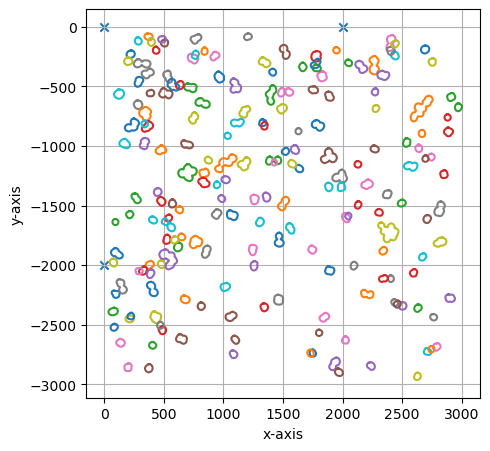

===== Collection Stats =====
Number of shapes: 201
Number of vertices: 15,711
Mean vertices: 78
Min vertices: 52
5% percentile vertices: 58
Median vertices: 69
95% percentile vertices: 123
Max vertices: 211
[0 0]
[      0 -200000]
[200000      0]
[20/03/2025 14:07:16] Saved output at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_sharded_WGA/selection/large_cells_small_cells.xml
[20/03/2025 14:07:16] Cleaned up temporary directory at <TemporaryDirectory '/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./LMDSelection_mujjczqo'>


In [ ]:
project.select(cells_to_select, calibration_marker)